In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
from functools import reduce
import re as re
sns.set()

In [2]:
for file in os.listdir("Data"):
    if file.endswith(".csv"):
        filepath = os.path.join("Data/", file)
df = pd.read_csv(filepath)

In [3]:
FnCas12a = df[df['Protein State']=="FnCas12a"]
FnCas12a_crRNA = df[df['Protein State']=="FnCas12a-crRNA"]
FnCas12a_crRNA_activator = df[df['Protein State']=="FnCas12a-crRNA-activator"]
FnCas12a = FnCas12a.drop('Protein State', axis =1)
FnCas12a_crRNA = FnCas12a_crRNA.drop('Protein State', axis =1)
FnCas12a_crRNA_activator = FnCas12a_crRNA_activator.drop('Protein State', axis =1)

In [4]:
apo = FnCas12a.copy()
bi = FnCas12a_crRNA.copy()
tr = FnCas12a_crRNA_activator.copy()
frames = [apo, bi, tr]

In [5]:
df1 = reduce(lambda  left,right: pd.merge(left,right,on=['Start', 'End', 'Sequence', 'Deut Time (sec)', 'maxD'],
                                          how='outer'), frames)

In [6]:
df1.columns = ['Start', 'End', 'Sequence', 'Deut Time (sec)', 'maxD', '#D_apo', '%D_apo',
       'Conf Interval (#D)_apo', '#Pts_apo', 'Confidence_apo', 'Stddev_apo', 'p_apo',
       '#D_bi', '%D_bi', 'Conf Interval (#D)_bi', '#Pts_bi', 'Confidence_bi',
       'Stddev_bi', 'p_bi', '#D_tr', '%D_tr', 'Conf Interval (#D)_tr', '#Pts_tr',
       'Confidence_tr', 'Stddev_tr', 'p_tr']


In [7]:
df1['pepn']=  df1['Sequence'] + df1.Start.astype("str").apply(lambda x: " (" + x + "-") + df1.End.astype("str").apply(lambda x: x + ")")


In [ ]:
# peptides_1 = [i for i in df1['pepn'].unique()]
# peptides_1

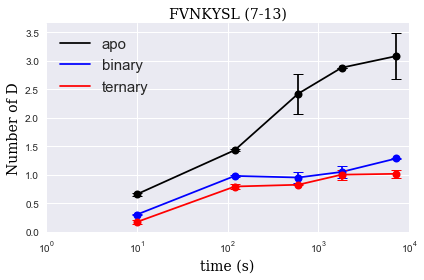

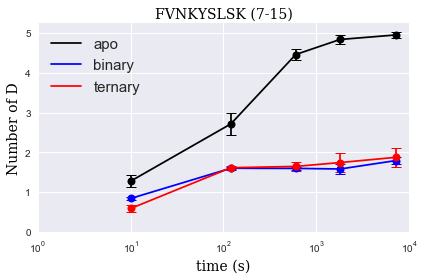

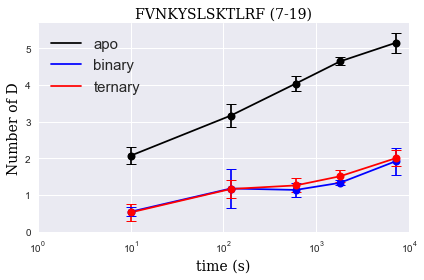

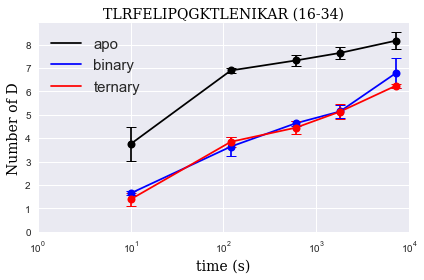

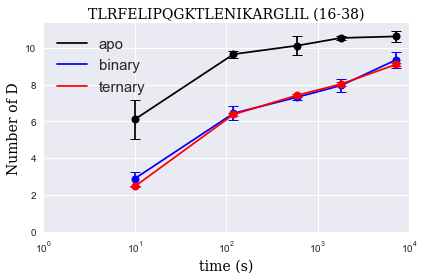

...

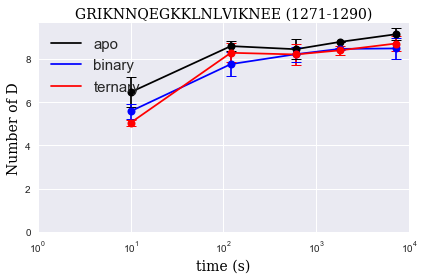

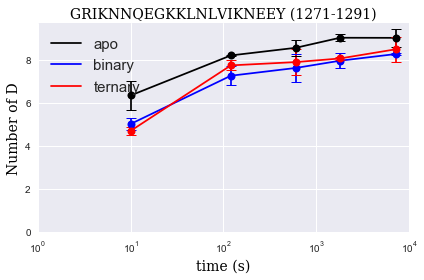

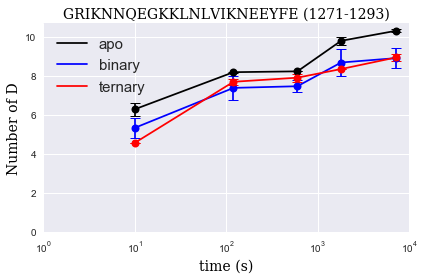

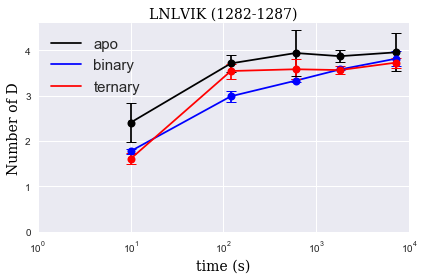

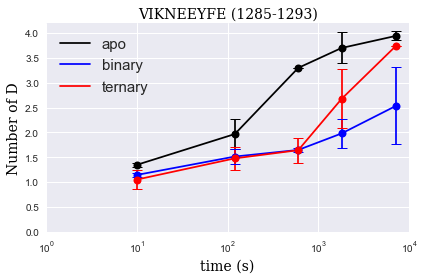

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import datetime

 
peptides = [i for i in df1['pepn'].unique()]

for p in peptides:
    df2 = df1[df1.pepn== p]
    
# Create data

    a = (df2['Deut Time (sec)'], df2['#D_apo'])

    b = (df2['Deut Time (sec)'], df2['#D_bi'])

    c = (df2['Deut Time (sec)'], df2['#D_tr'])

    #plt.errorbar(x, y, yerr=e, fmt='o')
    a_std =  df2['Stddev_apo'].values.tolist()
    b_std =  df2['Stddev_bi'].values.tolist()
    c_std =  df2['Stddev_tr'].values.tolist()
    
    errors = (a_std, b_std, c_std)
 
    data = (a, b, c)
    colors = ("black", "blue", "red")
    groups = ("apo",  "binary", "ternary") 
 
    # Create plot
    fig = plt.figure()
    ax = fig.add_subplot(1, 1,1)
    ax.set_xscale('log')
 
    for data, color, group, error in zip(data, colors, groups, errors):
        x, y = data
        ax.scatter(x, y, c=color, edgecolors='none', s=30, label = None )
        ax.plot(x,y,c=color, label = group)
        
        (_, caps, _) = ax.errorbar(x, y, yerr=error, fmt='o', markersize=8, capsize=5, label = None, c= color)

        for cap in caps:
            cap.set_markeredgewidth(1)
        
        
    plt.xlim(1, 10000)
    plt.ylim(ymin=0)

    font = {'family': 'serif','color':  'black', 'weight': 'normal','size': 14}
    plt.rc("font") 


    plt.xlabel('time (s)', fontdict = font)
    plt.ylabel("Number of D",fontdict = font)
    
    
    plt.title(p ,fontdict = font)
    plt.legend(fontsize = 15,loc=2)


    plt.tight_layout()
    

    #plt.savefig("Plots/" + p + '.pdf', format='pdf', dpi=200)
    
    plt.show()
    


##### pylab_examples example code: multipage_pdf.py



### Saving all plots as one pdf file 

/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


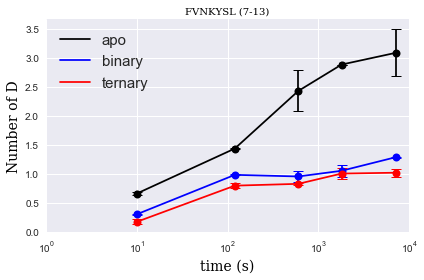

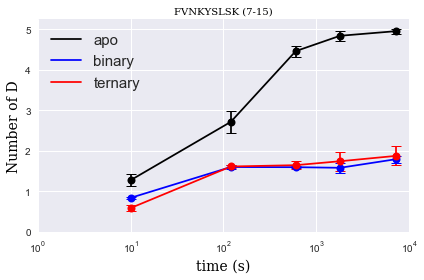

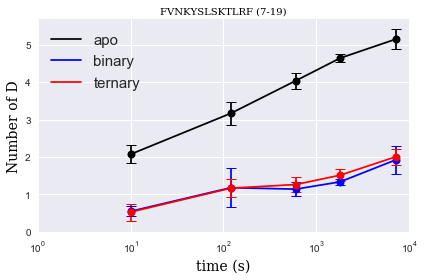

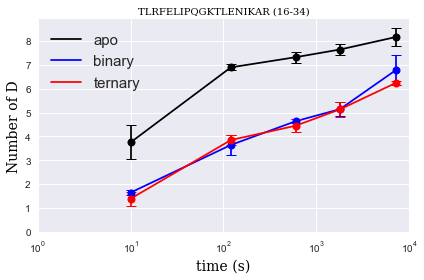

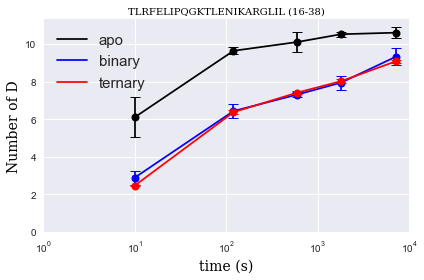

...

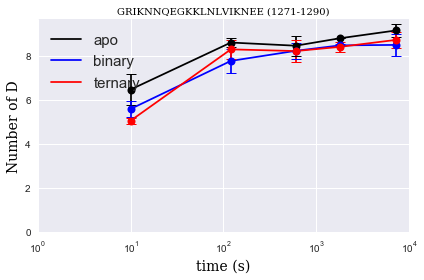

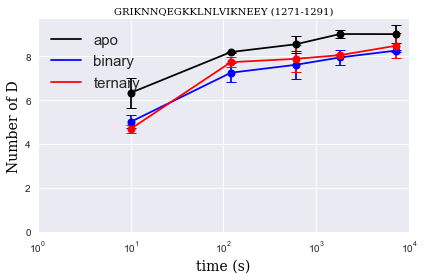

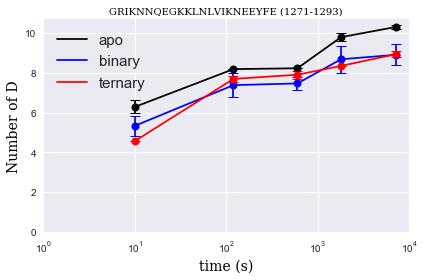

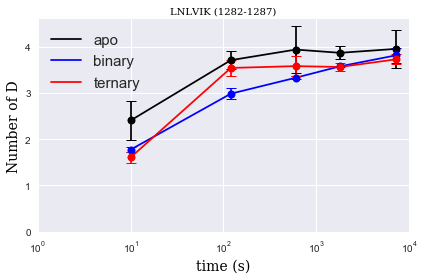

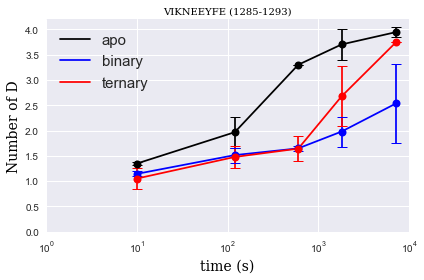

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import datetime
from matplotlib.backends.backend_pdf import PdfPages

with PdfPages('FnCas12a_uptake_plots.pdf') as pdf: 
    
    peptides = [i for i in df1['pepn'].unique()]

    for p in peptides:
        df2 = df1[df1.pepn== p]

    # Create data

        a = (df2['Deut Time (sec)'], df2['#D_apo'])

        b = (df2['Deut Time (sec)'], df2['#D_bi'])

        c = (df2['Deut Time (sec)'], df2['#D_tr'])

        #plt.errorbar(x, y, yerr=e, fmt='o')
        a_std =  df2['Stddev_apo'].values.tolist()
        b_std =  df2['Stddev_bi'].values.tolist()
        c_std =  df2['Stddev_tr'].values.tolist()

        errors = (a_std, b_std, c_std)

        data = (a, b, c)
        colors = ("black", "blue", "red")
        groups = ("apo",  "binary", "ternary") 

        # Create plot
        fig = plt.figure()
        ax = fig.add_subplot(1, 1,1)
        ax.set_xscale('log')

        for data, color, group, error in zip(data, colors, groups, errors):
            x, y = data
            ax.scatter(x, y, c=color, edgecolors='none', s=30, label = None )
            ax.plot(x,y,c=color, label = group)

            (_, caps, _) = ax.errorbar(x, y, yerr=error, fmt='o', markersize=8, capsize=5, label = None, c= color)

            for cap in caps:
                cap.set_markeredgewidth(1)


        plt.xlim(1, 10000)
        plt.ylim(ymin=0)

        font = {'family': 'serif','color':  'black', 'weight': 'normal','size': 14}
        font_t = {'family': 'serif','color':  'black', 'weight': 'normal','size': 10}
        plt.rc("font") 


        plt.xlabel('time (s)', fontdict = font)
        plt.ylabel("Number of D",fontdict = font)


        plt.title(p ,fontdict = font_t)
        plt.legend(fontsize = 15,loc=2)


        plt.tight_layout()


        pdf.savefig()

